## Data Exploration

Data: CVS file with GPS traces 

Objectives:

1. Identify vehicle stops (locations where vehicles remain stationary for a certain period)
2. Create visualizations to communicate your findings
3. Nice to have: detect patterns or behaviors in the data

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm # for color maps
import matplotlib.colors as colors # for color normalization
import seaborn as sns

import geopandas as gpd # to handle geospatial data
from shapely import wkt # to convert WKT strings to geometry objects

from geopy.distance import geodesic  # to calculate distances between coordinates

from IPython.display import display, Markdown # to display Markdown in Jupyter notebooks

import warnings
warnings.filterwarnings('ignore')

In [2]:
gps_traces_df = pd.read_csv("../data/raw/gps_traces.csv")

print(f"{'Shape:'} {gps_traces_df.shape}")
print(f"{'Columns:'} {gps_traces_df.columns.tolist()}")

gps_traces_df.head()

Shape: (5908, 4)
Columns: ['geom_wkt', 'trace_number', 'device_id', 'ts']


,geom_wkt,trace_number,device_id,ts
0,POINT (116.391305 39.898573),1,19,2008-12-11 04:42:14+00
1,POINT (116.391317 39.898617),1,19,2008-12-11 04:42:16+00
2,POINT (116.390928 39.898613),1,19,2008-12-11 04:43:26+00
3,POINT (116.390833 39.898635),1,19,2008-12-11 04:43:32+00
4,POINT (116.38941 39.898723),1,19,2008-12-11 04:43:47+00


In [3]:
gps_traces_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5908 entries, 0 to 5907
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   geom_wkt      5908 non-null   object
 1   trace_number  5908 non-null   int64 
 2   device_id     5908 non-null   int64 
 3   ts            5908 non-null   object
dtypes: int64(2), object(2)
memory usage: 184.8+ KB


In [4]:
# ts is an object, convert to timestamp
gps_traces_df["ts"] = pd.to_datetime(gps_traces_df["ts"])

In [5]:
# Sort
gps_traces_df = gps_traces_df.sort_values(by=['device_id', 'trace_number', 'ts']).reset_index(drop=True)
gps_traces_df.head()

,geom_wkt,trace_number,device_id,ts
0,POINT (116.590957 40.071961),2,0,2009-06-29 07:02:25+00:00
1,POINT (116.590905 40.072007),2,0,2009-06-29 07:02:30+00:00
2,POINT (116.590879 40.072027),2,0,2009-06-29 07:02:35+00:00
3,POINT (116.590915 40.072004),2,0,2009-06-29 07:02:40+00:00
4,POINT (116.590961 40.071983),2,0,2009-06-29 07:02:45+00:00


In [6]:
# Combinations
gps_traces_df[['device_id', 'trace_number']].drop_duplicates().reset_index(drop=True)

,device_id,trace_number
0,0,2
1,2,3
2,2,4
3,2,5
4,19,1


In [7]:
print(f"Number of records\n{gps_traces_df.device_id.value_counts()}")
print(f"\n% of all the records\n{gps_traces_df.device_id.value_counts(normalize=True)*100}")

Number of records
device_id
2     4545
0      897
19     466
Name: count, dtype: int64

% of all the records
device_id
2     76.929587
0     15.182803
19     7.887610
Name: proportion, dtype: float64


In [8]:
print(f"Number of records\n{gps_traces_df.trace_number.value_counts()}")
print(f"\n% of all the records\n{gps_traces_df.trace_number.value_counts(normalize=True)*100}")

Number of records
trace_number
4    1864
3    1810
2     897
5     871
1     466
Name: count, dtype: int64

% of all the records
trace_number
4    31.550440
3    30.636425
2    15.182803
5    14.742722
1     7.887610
Name: proportion, dtype: float64


In [9]:
# Check for missing values
print(f"Missing values:\n{gps_traces_df.isnull().sum()}\n")
# Check for duplicates
print(f"Duplicate rows: {gps_traces_df.duplicated().sum()}")

Missing values:
geom_wkt        0
trace_number    0
device_id       0
ts              0
dtype: int64

Duplicate rows: 0


In [10]:
# Convert WKT strings to Shapely geometries (a Python object that represents a geometric shape)
gps_traces_df["geometry"] = gps_traces_df["geom_wkt"].apply(wkt.loads)

# Create a GeoDataFrame from the DataFrame
gdf = (
    gpd.GeoDataFrame(gps_traces_df, geometry="geometry")
    .copy() # to avoid modifying gps_traces_df
    .set_crs(epsg=4326)  # set the CRS (Coordinate Reference System) to WGS84 (latitude/longitude) for spatial operations later on)
    .drop(columns=["geom_wkt"], axis=1)  # drop the original WKT column
)

gdf.head()

,trace_number,device_id,ts,geometry
0,2,0,2009-06-29 07:02:25+00:00,POINT (116.59096 40.07196)
1,2,0,2009-06-29 07:02:30+00:00,POINT (116.5909 40.07201)
2,2,0,2009-06-29 07:02:35+00:00,POINT (116.59088 40.07203)
3,2,0,2009-06-29 07:02:40+00:00,POINT (116.59092 40.072)
4,2,0,2009-06-29 07:02:45+00:00,POINT (116.59096 40.07198)


In [11]:
# Extract the unique pairs (device_id, trace_number)
unique_pairs = gdf[['device_id', 'trace_number']].drop_duplicates().reset_index(drop=True)

# Create a list of tuples (device_id, trace_number)
pairs = list(unique_pairs.itertuples(index=False, name=None)) 
print(f"pairs: {pairs}\n")

# Create a colormap with distinct colors for each pair
cmap = cm.get_cmap('winter_r', len(pairs)) 

# Map (device_id, trace_number) tuple to a color
color_dict = {pair: colors.to_hex(cmap(i))  
              for i, pair in enumerate(pairs)}

print(f"color mapping: {color_dict}")

gdf.head()

pairs: [(0, 2), (2, 3), (2, 4), (2, 5), (19, 1)]

color mapping: {(0, 2): '#00ff80', (2, 3): '#00bf9f', (2, 4): '#0080bf', (2, 5): '#0040df', (19, 1): '#0000ff'}


,trace_number,device_id,ts,geometry
0,2,0,2009-06-29 07:02:25+00:00,POINT (116.59096 40.07196)
1,2,0,2009-06-29 07:02:30+00:00,POINT (116.5909 40.07201)
2,2,0,2009-06-29 07:02:35+00:00,POINT (116.59088 40.07203)
3,2,0,2009-06-29 07:02:40+00:00,POINT (116.59092 40.072)
4,2,0,2009-06-29 07:02:45+00:00,POINT (116.59096 40.07198)


In [12]:
# Add device_trace_pair column
gdf['device_trace_pair'] = list(zip(gdf['device_id'], gdf['trace_number']))
gdf.head()

,trace_number,device_id,ts,geometry,device_trace_pair
0,2,0,2009-06-29 07:02:25+00:00,POINT (116.59096 40.07196),"(0, 2)"
1,2,0,2009-06-29 07:02:30+00:00,POINT (116.5909 40.07201),"(0, 2)"
2,2,0,2009-06-29 07:02:35+00:00,POINT (116.59088 40.07203),"(0, 2)"
3,2,0,2009-06-29 07:02:40+00:00,POINT (116.59092 40.072),"(0, 2)"
4,2,0,2009-06-29 07:02:45+00:00,POINT (116.59096 40.07198),"(0, 2)"


In [13]:
# Map the color to the pairs
gdf['color'] = gdf['device_trace_pair'].map(color_dict).astype('category')
gdf.head()

,trace_number,device_id,ts,geometry,device_trace_pair,color
0,2,0,2009-06-29 07:02:25+00:00,POINT (116.59096 40.07196),"(0, 2)",#00ff80
1,2,0,2009-06-29 07:02:30+00:00,POINT (116.5909 40.07201),"(0, 2)",#00ff80
2,2,0,2009-06-29 07:02:35+00:00,POINT (116.59088 40.07203),"(0, 2)",#00ff80
3,2,0,2009-06-29 07:02:40+00:00,POINT (116.59092 40.072),"(0, 2)",#00ff80
4,2,0,2009-06-29 07:02:45+00:00,POINT (116.59096 40.07198),"(0, 2)",#00ff80


In [14]:
# Plot the traces 

gdf.explore(
    column='color',
    categorical=True,
    legend=False,
    cmap=gdf['color'].cat.categories.tolist()  # exact hex codes in order
)

### Speed analysis

In [15]:
gdf_speed_df = (gdf
                .copy()
                .drop(columns=['device_trace_pair']))
gdf_speed_df.head()

,trace_number,device_id,ts,geometry,color
0,2,0,2009-06-29 07:02:25+00:00,POINT (116.59096 40.07196),#00ff80
1,2,0,2009-06-29 07:02:30+00:00,POINT (116.5909 40.07201),#00ff80
2,2,0,2009-06-29 07:02:35+00:00,POINT (116.59088 40.07203),#00ff80
3,2,0,2009-06-29 07:02:40+00:00,POINT (116.59092 40.072),#00ff80
4,2,0,2009-06-29 07:02:45+00:00,POINT (116.59096 40.07198),#00ff80


In [16]:
pairs

[(0, 2), (2, 3), (2, 4), (2, 5), (19, 1)]

In [17]:
# Function to calculate the speed
def calculate_speed(group):
    # Extract coordinates from geometry
    group['lat'] = group.geometry.y
    group['lon'] = group.geometry.x
    
    # Calculate distance between consecutive points (in meters)
    distances = []
    time_diffs = []
    
    for i in range(1, len(group)):
        # Distance using geodesic calculation (accounts for Earth's curvature)
        coord1 = (group.iloc[i-1]['lat'], group.iloc[i-1]['lon'])
        coord2 = (group.iloc[i]['lat'], group.iloc[i]['lon'])
        dist = geodesic(coord1, coord2).meters
        distances.append(dist)
        
        # Time difference in seconds
        time_diff = (group.iloc[i]['ts'] - group.iloc[i-1]['ts']).total_seconds()
        time_diffs.append(time_diff)
    
    # Add NaN for first point (no previous point to compare)
    distances = [float('nan')] + distances
    time_diffs = [float('nan')] + time_diffs
    
    group['distance_m'] = distances
    group['time_diff_s'] = time_diffs
    group['speed_ms'] = group['distance_m'] / group['time_diff_s']  # m/s
    group['speed_kmh'] = group['speed_ms'] * 3.6  # km/h
    
    return group

In [18]:
# Apply calculation to each device
gdf_speed_df = gdf_speed_df.groupby('trace_number').apply(calculate_speed).reset_index(drop=True)

In [19]:
gdf_speed_df.head()

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh
0,1,19,2008-12-11 04:42:14+00:00,POINT (116.3913 39.89857),#0000ff,39.898573,116.391305,NaN,NaN,NaN,NaN
1,1,19,2008-12-11 04:42:16+00:00,POINT (116.39132 39.89862),#0000ff,39.898617,116.391317,4.992061,2.0,2.496031,8.985710
2,1,19,2008-12-11 04:43:26+00:00,POINT (116.39093 39.89861),#0000ff,39.898613,116.390928,33.270250,70.0,0.475289,1.711041
3,1,19,2008-12-11 04:43:32+00:00,POINT (116.39083 39.89864),#0000ff,39.898635,116.390833,8.483676,6.0,1.413946,5.090206
4,1,19,2008-12-11 04:43:47+00:00,POINT (116.38941 39.89872),#0000ff,39.898723,116.389410,122.086490,15.0,8.139099,29.300758


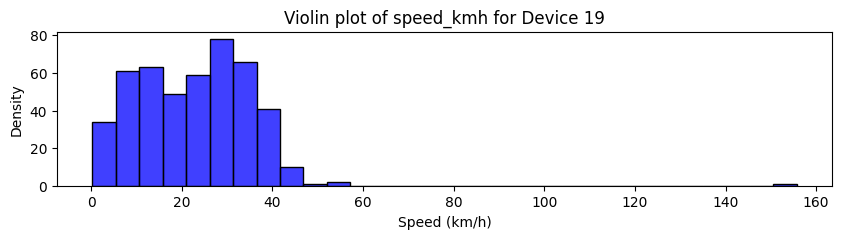

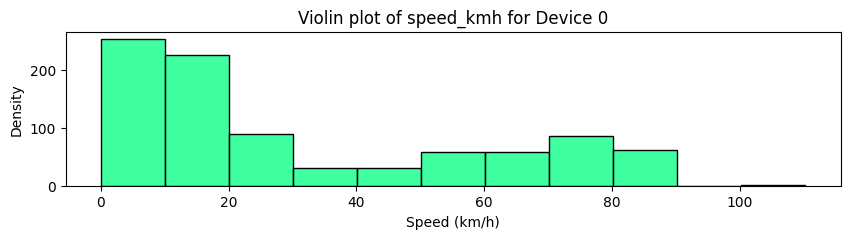

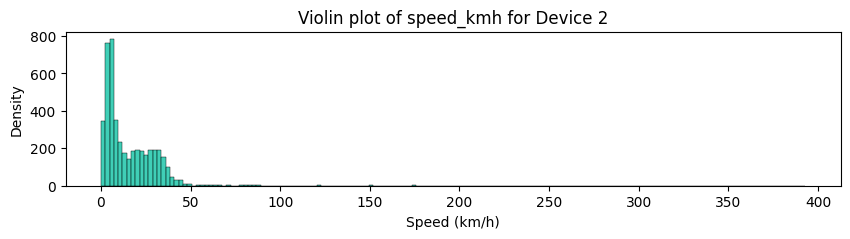

In [20]:
for device_id in gdf_speed_df['device_id'].unique():
    device_data = gdf_speed_df[gdf_speed_df['device_id'] == device_id]
    
    violin_color = device_data['color'].iloc[0]
    
    plt.figure(figsize=(10, 2))
    sns.histplot(x=device_data['speed_kmh'], color=violin_color)
    
    plt.title(f'Violin plot of speed_kmh for Device {device_id}')
    plt.xlabel('Speed (km/h)')
    plt.ylabel('Density')
    plt.show()

### Remove outliers 

- device 19: let's cut of at 75, since the traffic is really urban, so no highway
- device 0: seems logic (highway)
- device 2: goes up to 400 in urban region?! cut at 75
- note: it's also an option to do a reproducible cut-off at let's say 120 km/h, but for now let's look at the plots

In [21]:
gdf_speed_df = gdf_speed_df[(gdf_speed_df['device_id'] == 0) |
                            ((gdf_speed_df['speed_kmh'] < 75) & (gdf_speed_df['device_id'] == 2)) |
                            ((gdf_speed_df['speed_kmh'] < 75) & (gdf_speed_df['device_id'] == 19))] 

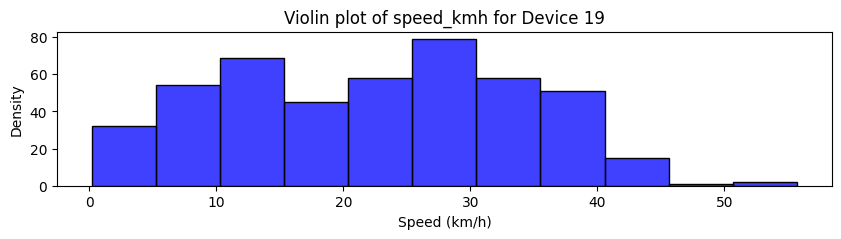

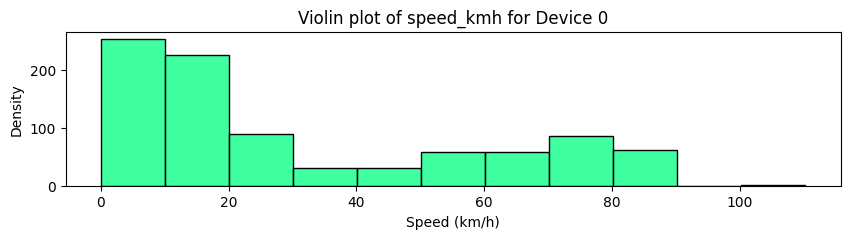

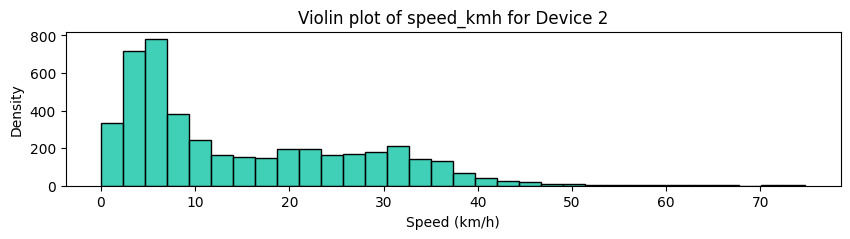

In [22]:
for device_id in gdf_speed_df['device_id'].unique():
    device_data = gdf_speed_df[gdf_speed_df['device_id'] == device_id]
    
    violin_color = device_data['color'].iloc[0]
    
    plt.figure(figsize=(10, 2))
    sns.histplot(x=device_data['speed_kmh'], color=violin_color)
    
    plt.title(f'Violin plot of speed_kmh for Device {device_id}')
    plt.xlabel('Speed (km/h)')
    plt.ylabel('Density')
    plt.show()

### To answer the question: 

- device 0: which we saw was on the highway is a car
- device 2 and 19: assumed to be a car, but can also be an e-bike

In [23]:
gdf_speed_df

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh
1,1,19,2008-12-11 04:42:16+00:00,POINT (116.39132 39.89862),#0000ff,39.898617,116.391317,4.992061,2.0,2.496031,8.985710
2,1,19,2008-12-11 04:43:26+00:00,POINT (116.39093 39.89861),#0000ff,39.898613,116.390928,33.270250,70.0,0.475289,1.711041
3,1,19,2008-12-11 04:43:32+00:00,POINT (116.39083 39.89864),#0000ff,39.898635,116.390833,8.483676,6.0,1.413946,5.090206
4,1,19,2008-12-11 04:43:47+00:00,POINT (116.38941 39.89872),#0000ff,39.898723,116.389410,122.086490,15.0,8.139099,29.300758
6,1,19,2008-12-11 04:43:52+00:00,POINT (116.39061 39.89784),#0000ff,39.897837,116.390608,12.497334,2.0,6.248667,22.495201
...,...,...,...,...,...,...,...,...,...,...,...
5903,5,2,2009-02-25 14:31:04+00:00,POINT (116.33719 39.92623),#0040df,39.926232,116.337194,9.477992,2.0,4.738996,17.060386
5904,5,2,2009-02-25 14:31:09+00:00,POINT (116.33721 39.92624),#0040df,39.926237,116.337207,1.242267,5.0,0.248453,0.894432
5905,5,2,2009-02-25 14:31:14+00:00,POINT (116.33726 39.92621),#0040df,39.926207,116.337259,5.554803,5.0,1.110961,3.999458
5906,5,2,2009-02-25 14:31:19+00:00,POINT (116.33729 39.9262),#0040df,39.926201,116.337290,2.732512,5.0,0.546502,1.967409


### What are the intervals in seconds between gps signal?

In [24]:
gdf_time_interval_df = (gdf_speed_df
                        .copy()
                        .assign(time_diff_s=lambda df: df.groupby(['device_id', 'trace_number'])['ts'].diff().dt.total_seconds())
                        [['device_id', 'trace_number', 'ts', 'time_diff_s']]
                        .reset_index(drop=True))

gdf_time_interval_df.head()


,device_id,trace_number,ts,time_diff_s
0,19,1,2008-12-11 04:42:16+00:00,NaN
1,19,1,2008-12-11 04:43:26+00:00,70.0
2,19,1,2008-12-11 04:43:32+00:00,6.0
3,19,1,2008-12-11 04:43:47+00:00,15.0
4,19,1,2008-12-11 04:43:52+00:00,5.0


In [25]:
print(gdf_time_interval_df['time_diff_s'].describe())

count     5861.000000
mean        10.853950
std        311.854308
min          1.000000
25%          1.000000
50%          3.000000
75%          5.000000
max      19698.000000
Name: time_diff_s, dtype: float64


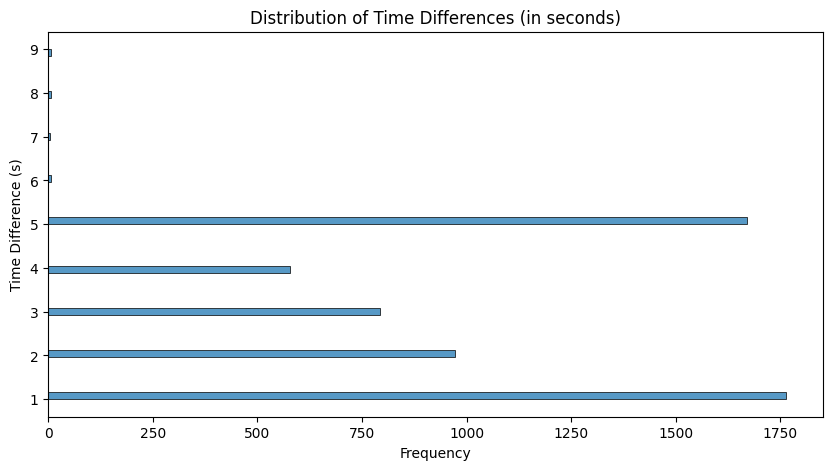

In [26]:
# Get a histplot of the time differences
plt.figure(figsize=(10, 5))
sns.histplot(y=gdf_time_interval_df[gdf_time_interval_df['time_diff_s']<10].time_diff_s, bins=50)
plt.title('Distribution of Time Differences (in seconds)')
plt.ylabel('Time Difference (s)')
plt.xlabel('Frequency')
plt.show()  

## Think about ways to detect stops

- easy
    - speed == 0
    - heuristic rule: speed == 0 for longer than x seconds
- medium
    - add feature that computes the moving average, if the speed at some point goes "way" below it, we might assume the vehicle is stopped
- hard
    - feature engineering
    - ML models
        - linear regression
        - random forest classifier
        - xgboost
- extreme
    - DL models

### speed == 0

In [27]:
gdf = gdf_speed_df.copy()

In [28]:
(gdf
.copy()
[gdf['speed_kmh'] == 0]
.reset_index(drop=True))

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh
0,2,0,2009-06-29 07:03:13+00:00,POINT (116.59097 40.072),#00ff80,40.071996,116.590971,0.0,3.0,0.0,0.0
1,2,0,2009-06-29 07:04:08+00:00,POINT (116.59038 40.07391),#00ff80,40.073909,116.590377,0.0,3.0,0.0,0.0
2,2,0,2009-06-29 07:04:25+00:00,POINT (116.59037 40.07396),#00ff80,40.073956,116.590368,0.0,5.0,0.0,0.0
3,2,0,2009-06-29 07:04:33+00:00,POINT (116.59037 40.07396),#00ff80,40.073957,116.590367,0.0,3.0,0.0,0.0
4,2,0,2009-06-29 07:04:35+00:00,POINT (116.59037 40.07396),#00ff80,40.073957,116.590367,0.0,2.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
64,4,2,2009-03-10 11:28:56+00:00,POINT (116.33566 39.92674),#0080bf,39.926736,116.335658,0.0,3.0,0.0,0.0
65,5,2,2009-02-25 10:46:23+00:00,POINT (116.30024 40.05053),#0040df,40.050532,116.300237,0.0,3.0,0.0,0.0
66,5,2,2009-02-25 10:47:50+00:00,POINT (116.29949 40.05089),#0040df,40.050889,116.299489,0.0,3.0,0.0,0.0
67,5,2,2009-02-25 14:00:10+00:00,POINT (116.34806 39.93936),#0040df,39.939362,116.348061,0.0,3.0,0.0,0.0


### Add column showing seconds past since stopped

In [29]:
gdf.head()

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh
1,1,19,2008-12-11 04:42:16+00:00,POINT (116.39132 39.89862),#0000ff,39.898617,116.391317,4.992061,2.0,2.496031,8.985710
2,1,19,2008-12-11 04:43:26+00:00,POINT (116.39093 39.89861),#0000ff,39.898613,116.390928,33.270250,70.0,0.475289,1.711041
3,1,19,2008-12-11 04:43:32+00:00,POINT (116.39083 39.89864),#0000ff,39.898635,116.390833,8.483676,6.0,1.413946,5.090206
4,1,19,2008-12-11 04:43:47+00:00,POINT (116.38941 39.89872),#0000ff,39.898723,116.389410,122.086490,15.0,8.139099,29.300758
6,1,19,2008-12-11 04:43:52+00:00,POINT (116.39061 39.89784),#0000ff,39.897837,116.390608,12.497334,2.0,6.248667,22.495201


In [30]:
# Data is sorted, but otherwise sort it with
# gdf = gdf.sort_values(['device_id', 'trace_number', 'ts']).reset_index(drop=True)

# Mark stops
gdf['stopped'] = gdf['speed_kmh'] == 0

In [31]:
gdf.head()

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh,stopped
1,1,19,2008-12-11 04:42:16+00:00,POINT (116.39132 39.89862),#0000ff,39.898617,116.391317,4.992061,2.0,2.496031,8.985710,False
2,1,19,2008-12-11 04:43:26+00:00,POINT (116.39093 39.89861),#0000ff,39.898613,116.390928,33.270250,70.0,0.475289,1.711041,False
3,1,19,2008-12-11 04:43:32+00:00,POINT (116.39083 39.89864),#0000ff,39.898635,116.390833,8.483676,6.0,1.413946,5.090206,False
4,1,19,2008-12-11 04:43:47+00:00,POINT (116.38941 39.89872),#0000ff,39.898723,116.389410,122.086490,15.0,8.139099,29.300758,False
6,1,19,2008-12-11 04:43:52+00:00,POINT (116.39061 39.89784),#0000ff,39.897837,116.390608,12.497334,2.0,6.248667,22.495201,False


In [32]:
gdf[gdf['stopped']].head()

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh,stopped
476,2,0,2009-06-29 07:03:13+00:00,POINT (116.59097 40.072),#00ff80,40.071996,116.590971,0.0,3.0,0.0,0.0,True
488,2,0,2009-06-29 07:04:08+00:00,POINT (116.59038 40.07391),#00ff80,40.073909,116.590377,0.0,3.0,0.0,0.0,True
492,2,0,2009-06-29 07:04:25+00:00,POINT (116.59037 40.07396),#00ff80,40.073956,116.590368,0.0,5.0,0.0,0.0,True
494,2,0,2009-06-29 07:04:33+00:00,POINT (116.59037 40.07396),#00ff80,40.073957,116.590367,0.0,3.0,0.0,0.0,True
495,2,0,2009-06-29 07:04:35+00:00,POINT (116.59037 40.07396),#00ff80,40.073957,116.590367,0.0,2.0,0.0,0.0,True


### Remember: Objective is to identify vehicle stops (locations where vehicles remain stationary for a certain period)

In [33]:
# Create a column marking when the vehicle started moving (transition: stopped → moving)
gdf['was_stopped'] = gdf['speed_kmh'] == 0
gdf['stop_to_move'] = (~gdf['was_stopped']) & (gdf['was_stopped'].shift(1, fill_value=False))

# Now create a cumulative stop group that only increments at the start of movement
gdf['stop_group'] = (
    gdf.groupby(['device_id', 'trace_number'])['stop_to_move']
    .cumsum()
)
    

In [34]:
# add red dots where the vehicle stopped
gdf['color'] = '#d62828'
# add blue dots where the vehicle was moving
gdf.loc[~gdf['stopped'], 'color'] = '#0077be'  

In [35]:
# Stop and repart example
gdf.loc[475:477]

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh,stopped,was_stopped,stop_to_move,stop_group
475,2,0,2009-06-29 07:03:10+00:00,POINT (116.59097 40.072),#0077be,40.071996,116.590971,0.203559,5.0,0.040712,0.146562,False,False,False,0
476,2,0,2009-06-29 07:03:13+00:00,POINT (116.59097 40.072),#d62828,40.071996,116.590971,0.000000,3.0,0.000000,0.000000,True,True,False,0
477,2,0,2009-06-29 07:03:15+00:00,POINT (116.59097 40.072),#0077be,40.071999,116.590970,0.343857,2.0,0.171929,0.618943,False,False,True,1


In [36]:
gdf.loc[487:489]

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh,stopped,was_stopped,stop_to_move,stop_group
487,2,0,2009-06-29 07:04:05+00:00,POINT (116.59038 40.07391),#0077be,40.073909,116.590377,0.781919,5.0,0.156384,0.562982,False,False,False,1
488,2,0,2009-06-29 07:04:08+00:00,POINT (116.59038 40.07391),#d62828,40.073909,116.590377,0.000000,3.0,0.000000,0.000000,True,True,False,1
489,2,0,2009-06-29 07:04:10+00:00,POINT (116.59038 40.07391),#0077be,40.073914,116.590375,0.580802,2.0,0.290401,1.045443,False,False,True,2


In [37]:
# Add coloring
gdf['color'] = (gdf['stopped']
                .map({True: '#d62828',    # red
                      False: '#0077b6'})) # blue

In [38]:
# Sort so that stopped=True (red) are last and they get plotted last (otherwise barely visible)
gdf = gdf.sort_values(by='stopped')

In [39]:
gdf.explore(
    color=gdf['color'],
    marker_type='circle_marker',
    style_kwds={
        'radius': 8,
        'fillOpacity': 0.9,
        'fill': True,
        'opacity': 0.9
    },
    tooltip=['stopped', 'device_id', 'trace_number', 'ts', 'speed_kmh', 'stop_group']
)


In [40]:
gdf.head()

,trace_number,device_id,ts,geometry,color,lat,lon,distance_m,time_diff_s,speed_ms,speed_kmh,stopped,was_stopped,stop_to_move,stop_group
1,1,19,2008-12-11 04:42:16+00:00,POINT (116.39132 39.89862),#0077b6,39.898617,116.391317,4.992061,2.0,2.496031,8.985710,False,False,False,0
3928,4,2,2009-03-10 11:09:49+00:00,POINT (116.35674 39.90592),#0077b6,39.905920,116.356743,8.891906,1.0,8.891906,32.010861,False,False,False,14
3927,4,2,2009-03-10 11:09:48+00:00,POINT (116.35685 39.90593),#0077b6,39.905931,116.356846,8.491753,1.0,8.491753,30.570312,False,False,False,14
3926,4,2,2009-03-10 11:09:47+00:00,POINT (116.35694 39.90594),#0077b6,39.905937,116.356945,6.181765,1.0,6.181765,22.254353,False,False,False,14
3925,4,2,2009-03-10 11:09:46+00:00,POINT (116.35702 39.90594),#0077b6,39.905942,116.357017,8.877335,2.0,4.438667,15.979202,False,False,False,14


In [41]:
for device_id, trace_number in pairs:
    print(f"Device {device_id}, trace {trace_number}")

Device 0, trace 2
Device 2, trace 3
Device 2, trace 4
Device 2, trace 5
Device 19, trace 1


### Plot stops for each device/trace

In [42]:


for device_id, trace_number in pairs:
    subset_gdf = gdf[(gdf['device_id'] == device_id) & (gdf['trace_number'] == trace_number)]

    # Title using Markdown
    display(Markdown(f"### Map for `device_id={device_id}`, `trace_number={trace_number}`"))

    # Create and display map
    m = subset_gdf.explore(
        color=subset_gdf['color'],
        marker_type='circle_marker',
        style_kwds={
            'radius': 8,
            'fillOpacity': 0.9,
            'fill': True,
            'opacity': 0.9
        },
        tooltip=['stopped', 'device_id', 'trace_number', 'ts', 'speed_kmh', 'stop_group']
    )
    
    display(m)

### Map for `device_id=0`, `trace_number=2`

### Map for `device_id=2`, `trace_number=3`

### Map for `device_id=2`, `trace_number=4`

### Map for `device_id=2`, `trace_number=5`

### Map for `device_id=19`, `trace_number=1`